## 🐶 Dog Face Detection using YOLOv8

Welcome to this project notebook on **Dog Face Detection** using **YOLOv8**

### 📌 Project Overview
In this notebook, we aim to develop a deep learning model capable of accurately detecting **dog faces** in images and videos. Leveraging the capabilities of **YOLOv8**, which is known for its speed and accuracy, we fine-tune the model on a dataset of dog faces to enable precise and real-time detection.

### 🔍 Objectives
- Load and preprocess a dataset containing dog face annotations.
- Train a YOLOv8 object detection model.
- Evaluate the performance of the model.
- Test the model on new images and videos to visualize detection results.

### 🐾 Why Dog Face Detection?
While human face detection is widely used, detecting dog faces can be useful in:
- Pet monitoring systems
- Veterinary health applications
- Animal behavior analysis
- Fun filters and AR apps for pets

In [1]:
!pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 994.1/994.1 kB 17.2 MB/s eta 0:00:00a 0:00:01


In [12]:
import pandas as pd
import numpy as np
from ultralytics import YOLO
import matplotlib.pyplot as plt
from matplotlib import animation, rc
from tqdm import tqdm
import os
import shutil
from shutil import copyfile
import cv2
import yaml
import random
from PIL import Image


rc('animation', html='jshtml')

In [30]:
label_dir = '/kaggle/input/dog-face-detectionyolo-format/train_label'
image_dir = '/kaggle/input/dog-face-detectionyolo-format/train_img'
train_output = 'datasets/train'
test_output = 'datasets/test'

### 🖼️ Displaying Sample Images from the Dataset

This code snippet loads and displays the **first 6 images** from the dataset directory to give a quick visual overview. It filters files by common image extensions, sorts them alphabetically, and arranges them in a **2x3 grid** using Matplotlib for easy viewing and verification.


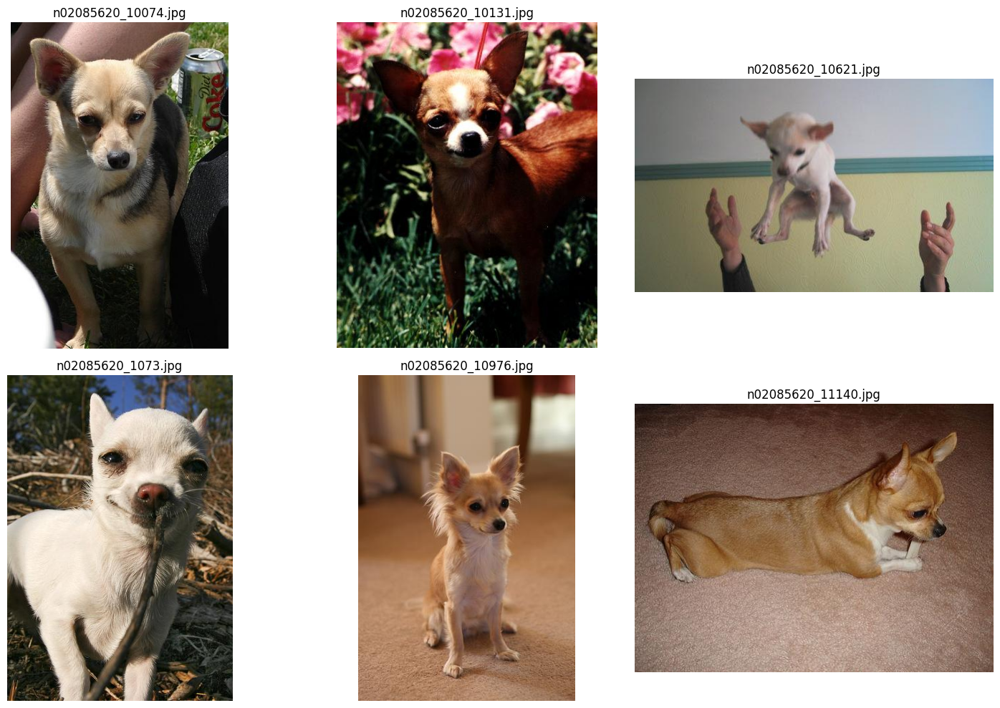

In [32]:
image_extensions = ('.jpg', '.jpeg', '.png', '.bmp')
image_files = [f for f in os.listdir(image_dir) if f.lower().endswith(image_extensions)]

# Sort and pick top 6
top_images = sorted(image_files)[:6]

# Set up the grid
fig, axes = plt.subplots(2, 3, figsize=(15, 10))
axes = axes.flatten()

# Display each image
for i, img_file in enumerate(top_images):
    img_path = os.path.join(image_dir, img_file)
    img = Image.open(img_path)
    axes[i].imshow(img)
    axes[i].set_title(img_file)
    axes[i].axis('off')

# Hide any unused axes
for j in range(len(top_images), len(axes)):
    axes[j].axis('off')

plt.tight_layout()
plt.show()

In [3]:
!mkdir datasets
!mkdir datasets/train
!mkdir datasets/valid
!mkdir datasets/test

### 📁 Sampling and Splitting Dataset

This section **randomly samples 200 images** from the dataset and splits them into a **75% training** and **25% testing** set. For each image, the corresponding label file (in `.txt` format) is also copied to the appropriate output directory (`train_output` or `test_output`), ensuring images and annotations stay paired.


In [4]:
# Collect all image paths
image_paths = [
    os.path.join(root, file)
    for root, _, files in os.walk(image_dir)
    for file in files
]

# Sample 200 images
sampled_paths = random.sample(image_paths, 200)

# Split and copy images and labels
split_index = len(sampled_paths) * 3 // 4
for i, img_path in enumerate(sampled_paths):
    label_filename = os.path.splitext(os.path.basename(img_path))[0] + '.txt'
    label_path = os.path.join(label_dir, label_filename)

    if i < split_index:
        shutil.copy(img_path, train_output)
        shutil.copy(label_path, train_output)
    else:
        shutil.copy(img_path, test_output)
        shutil.copy(label_path, test_output)


In [5]:
# Validation directories
val_label_dir = '/kaggle/input/dog-face-detectionyolo-format/val_label'
val_image_dir = '/kaggle/input/dog-face-detectionyolo-format/val_img'
valid_output = 'datasets/valid'

# Collect all validation image paths
val_image_paths = [
    os.path.join(root, file)
    for root, _, files in os.walk(val_image_dir)
    for file in files
]

# Randomly sample 50 images
sampled_val_paths = random.sample(val_image_paths, 50)

# Copy images and corresponding label files
for img_path in sampled_val_paths:
    label_filename = os.path.splitext(os.path.basename(img_path))[0] + '.txt'
    label_path = os.path.join(val_label_dir, label_filename)

    shutil.copy(img_path, valid_output)
    shutil.copy(label_path, valid_output)

In [6]:
train_path='/kaggle/working/datasets/train'
valid_path='/kaggle/working/datasets/valid'
test_path='/kaggle/working/datasets/test'

In [7]:
import yaml

data_yaml = dict(
    train =train_path,
    val =valid_path,
    test=test_path,
    nc =1,
    names =['dog_face']
)

with open('data.yaml', 'w') as outfile:
    yaml.dump(data_yaml, outfile, default_flow_style=True)
    
%cat data.yaml

{names: [dog_face], nc: 1, test: /kaggle/working/datasets/test, train: /kaggle/working/datasets/train,
  val: /kaggle/working/datasets/valid}


In [8]:
yolo_path = "/kaggle/input/yolov8_default/other/2/2/yolov8x.pt"
model = YOLO(yolo_path)

In [9]:
model.train(
    data='/kaggle/working/data.yaml',     # path to dataset YAML
    epochs=100,
    imgsz=480,
    device=0,             # use CUDA device 0 (GPU); use 'cpu' to disable
    mode='train'          # optional, 'train' is the default
)

Ultralytics 8.3.104 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: task=detect, mode=train, model=/kaggle/input/yolov8_default/other/2/2/yolov8x.pt, data=/kaggle/working/data.yaml, epochs=100, time=None, patience=100, batch=16, imgsz=480, save=True, save_period=-1, cache=False, device=0, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=Fa

100%|██████████| 755k/755k [00:00<00:00, 18.0MB/s]


Overriding model.yaml nc=80 with nc=1

                   from  n    params  module                                       arguments                     
  0                  -1  1      2320  ultralytics.nn.modules.conv.Conv             [3, 80, 3, 2]                 
  1                  -1  1    115520  ultralytics.nn.modules.conv.Conv             [80, 160, 3, 2]               
  2                  -1  3    436800  ultralytics.nn.modules.block.C2f             [160, 160, 3, True]           
  3                  -1  1    461440  ultralytics.nn.modules.conv.Conv             [160, 320, 3, 2]              
  4                  -1  6   3281920  ultralytics.nn.modules.block.C2f             [320, 320, 6, True]           
  5                  -1  1   1844480  ultralytics.nn.modules.conv.Conv             [320, 640, 3, 2]              
  6                  -1  6  13117440  ultralytics.nn.modules.block.C2f             [640, 640, 6, True]           
  7                  -1  1   3687680  ultralytics

100%|██████████| 5.35M/5.35M [00:00<00:00, 75.3MB/s]


AMP: checks passed ✅


train: Scanning /kaggle/working/datasets/train... 150 images, 0 backgrounds, 0 corrupt: 100%|██████████| 150/150 [00:00<00:00, 1236.48it/s]

train: New cache created: /kaggle/working/datasets/train.cache


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


/usr/local/lib/python3.10/dist-packages/albumentations/__init__.py:24: UserWarning: A new version of Albumentations is available: 2.0.5 (you have 1.4.20). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
  check_for_updates()
val: Scanning /kaggle/working/datasets/valid... 50 images, 0 backgrounds, 0 corrupt: 100%|██████████| 50/50 [00:00<00:00, 985.44it/s]

val: New cache created: /kaggle/working/datasets/valid.cache


Plotting labels to runs/detect/train/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 97 weight(decay=0.0), 104 weight(decay=0.0005), 103 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 480 train, 480 val
Using 4 dataloader workers
Logging results to runs/detect/train
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100      8.21G      1.481      4.079      1.893          8        480: 100%|██████████| 10/10 [00:08<00:00,  1.23it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:02<00:00,  1.03s/it]

                   all         50         52      0.236     0.0577     0.0448     0.0149



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100      10.8G      1.605      3.286       1.85         10        480: 100%|██████████| 10/10 [00:07<00:00,  1.36it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.15it/s]

                   all         50         52     0.0155      0.904     0.0167    0.00779



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100      10.8G      1.613      2.507      1.806         14        480: 100%|██████████| 10/10 [00:07<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.22it/s]

                   all         50         52   0.000765      0.173   0.000525   0.000131



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      10.8G      1.735       2.16      1.904         16        480: 100%|██████████| 10/10 [00:07<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.37it/s]

                   all         50         52          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100      10.8G      1.873      2.329      2.022         20        480: 100%|██████████| 10/10 [00:07<00:00,  1.37it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.41it/s]

                   all         50         52          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100      10.8G      1.866      2.223      1.955         13        480: 100%|██████████| 10/10 [00:07<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.39it/s]

                   all         50         52          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100      10.8G      1.736      2.061      1.867         12        480: 100%|██████████| 10/10 [00:07<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.36it/s]

                   all         50         52          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100      10.8G      1.929      2.188      2.074         15        480: 100%|██████████| 10/10 [00:07<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.38it/s]

                   all         50         52          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100      10.8G      1.951      2.211      2.086         12        480: 100%|██████████| 10/10 [00:07<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95):   0%|          | 0/2 [00:00<?, ?it/s]/usr/local/lib/python3.10/dist-packages/ultralytics/engine/validator.py:289: RuntimeWarning: invalid value encountered in greater_equal
  matches = np.nonzero(iou >= threshold)  # IoU > threshold and classes match
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.36it/s]

                   all         50         52          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100      10.8G      1.826      1.955      1.934         18        480: 100%|██████████| 10/10 [00:07<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.27it/s]

                   all         50         52          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100      10.8G      1.845      1.972      1.967         17        480: 100%|██████████| 10/10 [00:07<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.26it/s]

                   all         50         52          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100      10.8G      1.809      1.996      1.969         12        480: 100%|██████████| 10/10 [00:07<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.11it/s]

                   all         50         52          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100      10.8G      1.759      1.862      1.922         12        480: 100%|██████████| 10/10 [00:07<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.10it/s]

                   all         50         52          0          0          0          0



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100      10.8G      1.765      1.867      1.922         12        480: 100%|██████████| 10/10 [00:07<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.15it/s]

                   all         50         52   6.86e-05     0.0192   3.41e-05   3.41e-06



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100      10.8G      1.776      1.917      1.925         17        480: 100%|██████████| 10/10 [00:07<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.22it/s]

                   all         50         52    0.00014     0.0385    7.3e-05   2.17e-05



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100      10.8G      1.777      1.877      1.989         14        480: 100%|██████████| 10/10 [00:07<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.26it/s]

                   all         50         52      0.124     0.0769     0.0211    0.00885



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100      10.8G      1.657      1.741      1.847         14        480: 100%|██████████| 10/10 [00:07<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.30it/s]

                   all         50         52      0.315      0.115     0.0579     0.0237



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100      10.8G      1.635      1.586      1.788         16        480: 100%|██████████| 10/10 [00:07<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.25it/s]

                   all         50         52      0.145      0.115     0.0593     0.0125



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100      10.8G      1.624      1.617      1.839         10        480: 100%|██████████| 10/10 [00:07<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.20it/s]

                   all         50         52      0.507      0.316      0.396      0.163



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100      10.8G      1.699      1.722      1.902         10        480: 100%|██████████| 10/10 [00:07<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.22it/s]

                   all         50         52      0.175      0.192     0.0894     0.0378



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100      10.8G      1.702      1.769      1.827         19        480: 100%|██████████| 10/10 [00:07<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.20it/s]

                   all         50         52      0.285      0.277      0.226      0.082



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100      10.8G      1.617      1.657      1.824         15        480: 100%|██████████| 10/10 [00:07<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.20it/s]

                   all         50         52      0.217      0.288      0.173     0.0808



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100      10.8G      1.587      1.601      1.825         12        480: 100%|██████████| 10/10 [00:07<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.24it/s]

                   all         50         52      0.149      0.212     0.0982      0.043



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100      10.8G      1.628      1.613      1.819         16        480: 100%|██████████| 10/10 [00:07<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.25it/s]

                   all         50         52      0.213      0.135     0.0928     0.0391



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100      10.8G      1.482      1.427      1.692         21        480: 100%|██████████| 10/10 [00:07<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.22it/s]

                   all         50         52       0.28      0.288      0.213     0.0889



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100      10.8G      1.513      1.403      1.685          9        480: 100%|██████████| 10/10 [00:07<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.22it/s]

                   all         50         52      0.553      0.442      0.442      0.173



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100      10.8G      1.503      1.421      1.735         11        480: 100%|██████████| 10/10 [00:07<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.24it/s]

                   all         50         52      0.571      0.481      0.505      0.181



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100      10.8G      1.553      1.328      1.733         14        480: 100%|██████████| 10/10 [00:07<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.24it/s]

                   all         50         52      0.406      0.538       0.35      0.119



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100      10.8G      1.544       1.36      1.723         12        480: 100%|██████████| 10/10 [00:07<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.24it/s]

                   all         50         52      0.138      0.231      0.105       0.03



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100      10.8G      1.552      1.388      1.763         17        480: 100%|██████████| 10/10 [00:07<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.26it/s]

                   all         50         52      0.259      0.135      0.102     0.0451



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100      10.8G      1.403      1.297      1.663         11        480: 100%|██████████| 10/10 [00:07<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.24it/s]

                   all         50         52      0.418      0.212      0.133     0.0593



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100      10.8G      1.462      1.322      1.693          7        480: 100%|██████████| 10/10 [00:07<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.24it/s]

                   all         50         52      0.564      0.547      0.527      0.221



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100      10.8G      1.467      1.342      1.681         15        480: 100%|██████████| 10/10 [00:07<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.23it/s]

                   all         50         52      0.635      0.596      0.629      0.283



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100      10.8G      1.388      1.276      1.637         19        480: 100%|██████████| 10/10 [00:07<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.22it/s]

                   all         50         52      0.671      0.706      0.745       0.37



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100      10.8G      1.402       1.29      1.642         13        480: 100%|██████████| 10/10 [00:07<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.23it/s]

                   all         50         52      0.625      0.635      0.703      0.373



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100      10.8G      1.405      1.281      1.664         17        480: 100%|██████████| 10/10 [00:07<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.23it/s]

                   all         50         52      0.672      0.552      0.646      0.348



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100      10.8G      1.354      1.218      1.607          9        480: 100%|██████████| 10/10 [00:07<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.22it/s]

                   all         50         52      0.654      0.692      0.675      0.347



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100      10.8G      1.319      1.173       1.59          9        480: 100%|██████████| 10/10 [00:07<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.23it/s]

                   all         50         52      0.464      0.615      0.515      0.222



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100      10.8G      1.343      1.134      1.585         16        480: 100%|██████████| 10/10 [00:07<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.24it/s]

                   all         50         52       0.35      0.353      0.245      0.112



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100      10.8G      1.377      1.114      1.655         13        480: 100%|██████████| 10/10 [00:07<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.24it/s]

                   all         50         52      0.559      0.173      0.191      0.096



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100      10.8G      1.313      1.186      1.628         12        480: 100%|██████████| 10/10 [00:07<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.24it/s]

                   all         50         52      0.496      0.577      0.537       0.25



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100      10.8G        1.3      1.148      1.572         13        480: 100%|██████████| 10/10 [00:07<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.22it/s]

                   all         50         52      0.796      0.846      0.802      0.408



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100      10.8G      1.271       1.04       1.59          9        480: 100%|██████████| 10/10 [00:07<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.22it/s]

                   all         50         52      0.823      0.807       0.82      0.444



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100      10.8G      1.296      1.051      1.585         13        480: 100%|██████████| 10/10 [00:07<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.17it/s]

                   all         50         52      0.789       0.75      0.791      0.415



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100      10.8G      1.226      1.042      1.543         13        480: 100%|██████████| 10/10 [00:07<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.22it/s]

                   all         50         52      0.837      0.788      0.814      0.405



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100      10.8G      1.288      1.048      1.562         12        480: 100%|██████████| 10/10 [00:07<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.20it/s]

                   all         50         52      0.775      0.808      0.817      0.348



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100      10.8G      1.271      1.009      1.537         15        480: 100%|██████████| 10/10 [00:07<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.22it/s]

                   all         50         52      0.693      0.827       0.78      0.359



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100      10.8G      1.273     0.9579       1.51         11        480: 100%|██████████| 10/10 [00:07<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.24it/s]

                   all         50         52       0.71      0.827      0.835       0.37



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100      10.8G      1.177     0.9919      1.458         16        480: 100%|██████████| 10/10 [00:07<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.24it/s]

                   all         50         52       0.85      0.712      0.829      0.409



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100      10.8G      1.159     0.9627       1.48         10        480: 100%|██████████| 10/10 [00:07<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.25it/s]

                   all         50         52      0.786      0.712      0.766      0.407



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100      10.8G      1.146     0.9196      1.444         17        480: 100%|██████████| 10/10 [00:07<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.22it/s]

                   all         50         52      0.791      0.654      0.711      0.391



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100      10.8G       1.17     0.9633      1.476         17        480: 100%|██████████| 10/10 [00:07<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.21it/s]

                   all         50         52       0.71      0.801        0.8      0.432



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100      10.8G      1.179     0.9731      1.463         14        480: 100%|██████████| 10/10 [00:07<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.24it/s]

                   all         50         52      0.812      0.731      0.789      0.448



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100      10.8G      1.154     0.9112      1.462         12        480: 100%|██████████| 10/10 [00:07<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.23it/s]

                   all         50         52      0.684      0.885      0.868      0.464



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100      10.8G      1.073     0.9134      1.392         10        480: 100%|██████████| 10/10 [00:07<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.21it/s]

                   all         50         52      0.767      0.846      0.844      0.424



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100      10.8G      1.148     0.9273      1.461         19        480: 100%|██████████| 10/10 [00:07<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.25it/s]

                   all         50         52      0.852      0.774      0.858      0.438



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100      10.8G      1.167     0.9759       1.51         12        480: 100%|██████████| 10/10 [00:07<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.25it/s]

                   all         50         52      0.758      0.723       0.81      0.437



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100      10.8G      1.134     0.9369      1.494         13        480: 100%|██████████| 10/10 [00:07<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.23it/s]

                   all         50         52      0.781      0.688      0.775      0.433



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100      10.8G      1.131     0.9728      1.473          8        480: 100%|██████████| 10/10 [00:07<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.25it/s]

                   all         50         52      0.783      0.846      0.884      0.511



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100      10.8G      1.172     0.9096      1.472         15        480: 100%|██████████| 10/10 [00:07<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.22it/s]

                   all         50         52      0.723      0.904      0.869      0.474



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100      10.8G       1.05     0.8259      1.362         12        480: 100%|██████████| 10/10 [00:07<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.23it/s]

                   all         50         52      0.781      0.865      0.867      0.457



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100      10.8G      1.055     0.8753      1.369         13        480: 100%|██████████| 10/10 [00:07<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.24it/s]

                   all         50         52      0.742      0.846      0.827      0.418



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100      10.8G       1.04     0.8305      1.391          9        480: 100%|██████████| 10/10 [00:07<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.25it/s]

                   all         50         52      0.793      0.846      0.869      0.461



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/100      10.8G      1.008     0.8121      1.374         11        480: 100%|██████████| 10/10 [00:07<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.24it/s]

                   all         50         52       0.81      0.818      0.861      0.471



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/100      10.8G      1.017     0.8124       1.35         12        480: 100%|██████████| 10/10 [00:07<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.25it/s]

                   all         50         52      0.783      0.831      0.824      0.416



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100      10.8G       1.03      0.838      1.356         13        480: 100%|██████████| 10/10 [00:07<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.24it/s]

                   all         50         52      0.814      0.692      0.776       0.42



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100      10.8G       1.03     0.8192      1.372         12        480: 100%|██████████| 10/10 [00:07<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.23it/s]

                   all         50         52      0.753      0.879      0.864      0.489



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/100      10.8G      1.053     0.7861      1.363         18        480: 100%|██████████| 10/10 [00:07<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.23it/s]

                   all         50         52      0.767      0.822      0.891      0.487



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100      10.8G          1     0.7585      1.335          7        480: 100%|██████████| 10/10 [00:07<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.22it/s]

                   all         50         52      0.741      0.879      0.859      0.487



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/100      10.8G     0.9724     0.7491      1.313         15        480: 100%|██████████| 10/10 [00:07<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.21it/s]

                   all         50         52      0.744      0.893      0.872      0.485



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/100      10.8G      1.002     0.8059      1.323         13        480: 100%|██████████| 10/10 [00:07<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.19it/s]

                   all         50         52      0.796      0.827      0.885      0.482



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/100      10.8G     0.9546      0.732      1.299         16        480: 100%|██████████| 10/10 [00:07<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.22it/s]

                   all         50         52       0.79       0.75      0.834      0.476



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/100      10.8G     0.9667     0.7508      1.317         14        480: 100%|██████████| 10/10 [00:07<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.25it/s]

                   all         50         52      0.806      0.769      0.842      0.485



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/100      10.8G     0.9736     0.7295      1.328         13        480: 100%|██████████| 10/10 [00:07<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.23it/s]

                   all         50         52       0.85      0.769      0.847      0.457



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/100      10.8G     0.8723     0.6808      1.282          8        480: 100%|██████████| 10/10 [00:07<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.25it/s]

                   all         50         52      0.793       0.81      0.854       0.45



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/100      10.8G     0.8982     0.7157      1.305         13        480: 100%|██████████| 10/10 [00:07<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.24it/s]

                   all         50         52       0.86      0.788      0.879      0.499



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/100      10.8G     0.8891     0.6933      1.261         11        480: 100%|██████████| 10/10 [00:07<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.25it/s]

                   all         50         52      0.745      0.899      0.859      0.508



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/100      10.8G     0.8748     0.6892      1.289         16        480: 100%|██████████| 10/10 [00:07<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.22it/s]

                   all         50         52       0.83      0.843      0.851      0.509



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/100      10.8G     0.8562     0.6653      1.234         13        480: 100%|██████████| 10/10 [00:07<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.24it/s]

                   all         50         52      0.828      0.846      0.873      0.505



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/100      10.8G     0.8598     0.6658      1.244         13        480: 100%|██████████| 10/10 [00:07<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.22it/s]

                   all         50         52      0.813      0.865      0.879      0.513



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/100      10.8G     0.8259     0.6501      1.231          9        480: 100%|██████████| 10/10 [00:07<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.25it/s]

                   all         50         52      0.842      0.821      0.879      0.493



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/100      10.8G     0.8581      0.642      1.257         12        480: 100%|██████████| 10/10 [00:07<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.24it/s]

                   all         50         52      0.813      0.827      0.883      0.496



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/100      10.8G      0.893     0.6541      1.267         15        480: 100%|██████████| 10/10 [00:07<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.25it/s]

                   all         50         52      0.866      0.871       0.91      0.538



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/100      10.8G     0.8745     0.6727      1.233         10        480: 100%|██████████| 10/10 [00:07<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.22it/s]

                   all         50         52      0.864      0.856      0.919      0.534



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/100      10.8G     0.8231     0.6153      1.231         16        480: 100%|██████████| 10/10 [00:07<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.25it/s]

                   all         50         52      0.897      0.865      0.907      0.528



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/100      10.8G     0.8274     0.6837      1.238         13        480: 100%|██████████| 10/10 [00:07<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.25it/s]

                   all         50         52      0.848      0.861      0.901      0.541



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/100      10.8G     0.7646     0.5866      1.141         11        480: 100%|██████████| 10/10 [00:07<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.26it/s]

                   all         50         52      0.878      0.865      0.927      0.538



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/100      10.8G     0.7741     0.5693      1.169         13        480: 100%|██████████| 10/10 [00:07<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.24it/s]

                   all         50         52      0.909      0.865      0.932      0.534



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/100      10.8G     0.7353     0.5751      1.174         16        480: 100%|██████████| 10/10 [00:07<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.26it/s]

                   all         50         52      0.872      0.846      0.892      0.534



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/100      10.8G     0.7946     0.6045      1.214         18        480: 100%|██████████| 10/10 [00:07<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.23it/s]

                   all         50         52      0.895      0.817      0.892      0.536


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/100      10.8G      0.658     0.4801      1.152          6        480: 100%|██████████| 10/10 [00:07<00:00,  1.32it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.23it/s]

                   all         50         52      0.848      0.856      0.907      0.532



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/100      10.8G     0.6932     0.4869      1.162          6        480: 100%|██████████| 10/10 [00:07<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.23it/s]

                   all         50         52      0.865      0.846      0.911      0.541



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/100      10.8G     0.6475     0.4499      1.132          6        480: 100%|██████████| 10/10 [00:07<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.23it/s]

                   all         50         52      0.872      0.865      0.898      0.547



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/100      10.8G     0.6665     0.4662      1.168          6        480: 100%|██████████| 10/10 [00:07<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.25it/s]

                   all         50         52      0.835      0.878      0.878      0.545



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/100      10.8G     0.6121     0.4247      1.079          6        480: 100%|██████████| 10/10 [00:07<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.25it/s]

                   all         50         52      0.897       0.84      0.884      0.547



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/100      10.8G     0.6692     0.4457      1.162          6        480: 100%|██████████| 10/10 [00:07<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.23it/s]

                   all         50         52      0.877      0.846      0.883      0.562



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/100      10.8G     0.5935     0.4353      1.108          6        480: 100%|██████████| 10/10 [00:07<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.24it/s]

                   all         50         52      0.881      0.865       0.89      0.567



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/100      10.8G     0.6276     0.4593      1.166          6        480: 100%|██████████| 10/10 [00:07<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.22it/s]

                   all         50         52      0.884      0.885      0.919      0.575



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/100      10.8G     0.5784     0.3919      1.062          6        480: 100%|██████████| 10/10 [00:07<00:00,  1.39it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.23it/s]

                   all         50         52      0.902      0.885      0.926      0.573



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/100      10.8G     0.5992     0.4323      1.095          6        480: 100%|██████████| 10/10 [00:07<00:00,  1.38it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:00<00:00,  2.22it/s]

                   all         50         52      0.893      0.885      0.927      0.579



100 epochs completed in 0.273 hours.
Optimizer stripped from runs/detect/train/weights/last.pt, 136.7MB
Optimizer stripped from runs/detect/train/weights/best.pt, 136.7MB

Validating runs/detect/train/weights/best.pt...
Ultralytics 8.3.104 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
Model summary (fused): 112 layers, 68,124,531 parameters, 0 gradients, 257.4 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 2/2 [00:01<00:00,  1.97it/s]


                   all         50         52      0.893      0.885      0.927      0.579


/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.10/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


Speed: 0.1ms preprocess, 15.8ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to runs/detect/train


ultralytics.utils.metrics.DetMetrics object with attributes:

ap_class_index: array([0])
box: ultralytics.utils.metrics.Metric object
confusion_matrix: <ultralytics.utils.metrics.ConfusionMatrix object at 0x7d7d433711b0>
curves: ['Precision-Recall(B)', 'F1-Confidence(B)', 'Precision-Confidence(B)', 'Recall-Confidence(B)']
curves_results: [[array([          0,    0.001001,    0.002002,    0.003003,    0.004004,    0.005005,    0.006006,    0.007007,    0.008008,    0.009009,     0.01001,    0.011011,    0.012012,    0.013013,    0.014014,    0.015015,    0.016016,    0.017017,    0.018018,    0.019019,     0.02002,    0.021021,    0.022022,    0.023023,
          0.024024,    0.025025,    0.026026,    0.027027,    0.028028,    0.029029,     0.03003,    0.031031,    0.032032,    0.033033,    0.034034,    0.035035,    0.036036,    0.037037,    0.038038,    0.039039,     0.04004,    0.041041,    0.042042,    0.043043,    0.044044,    0.045045,    0.046046,    0.047047,
          0.048048, 

### 📊 Visualizing Training Metrics & Predictions

This part of the notebook displays key **YOLOv8 training outputs**, including performance curves (F1, Precision-Recall), the confusion matrix, label distribution, and image batches from training and validation phases. These visualizations help evaluate the model’s learning progress and detection quality.

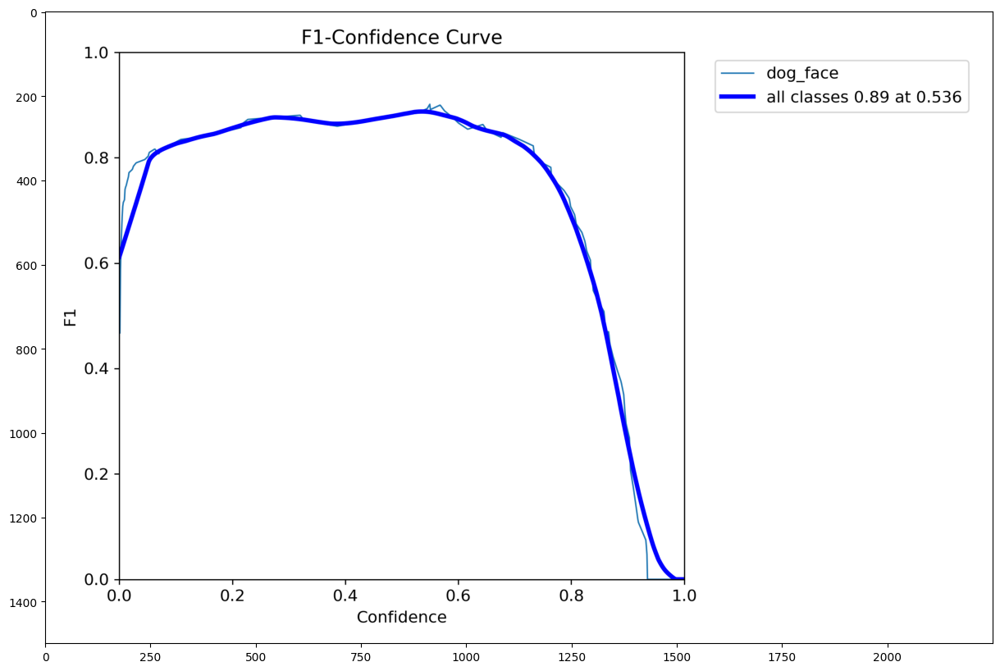

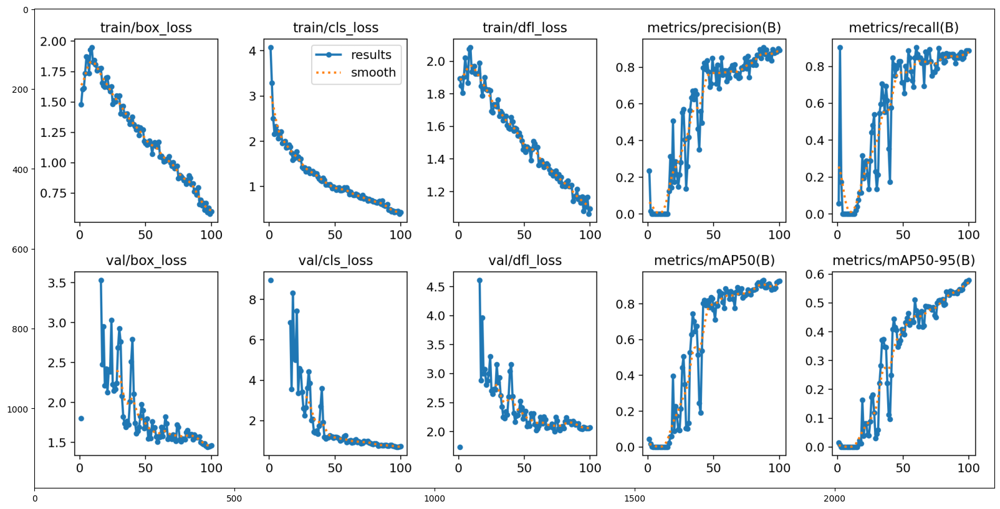

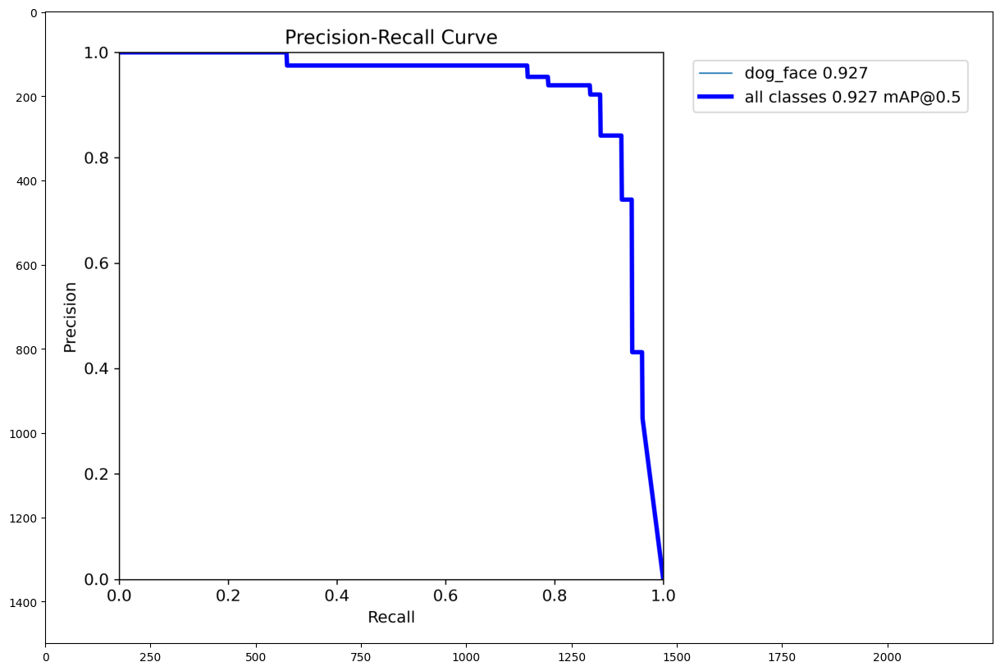

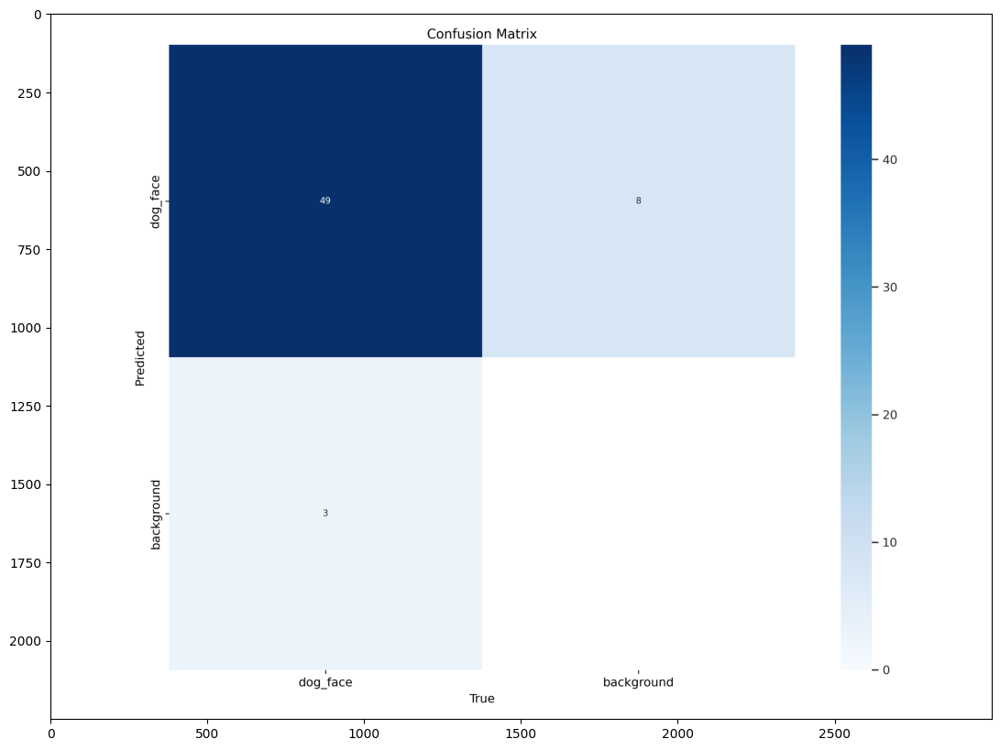

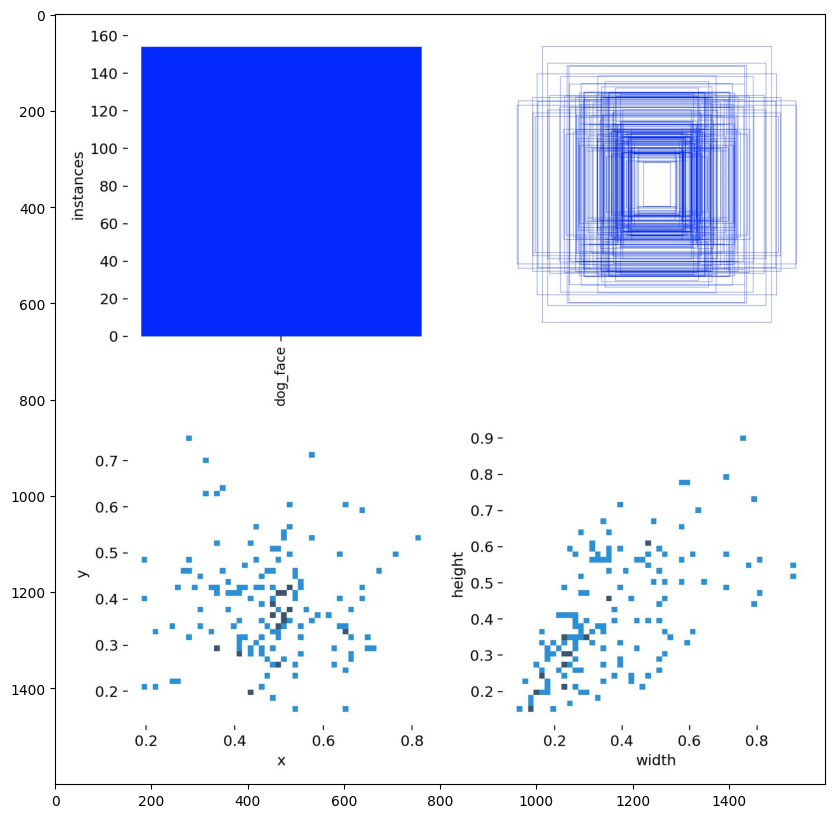

...

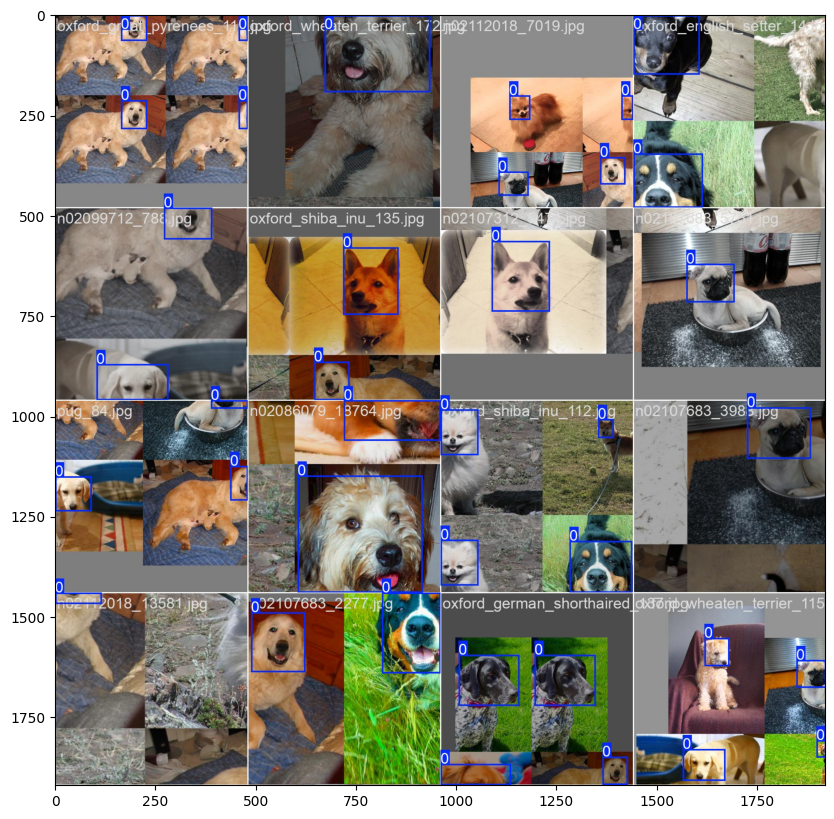

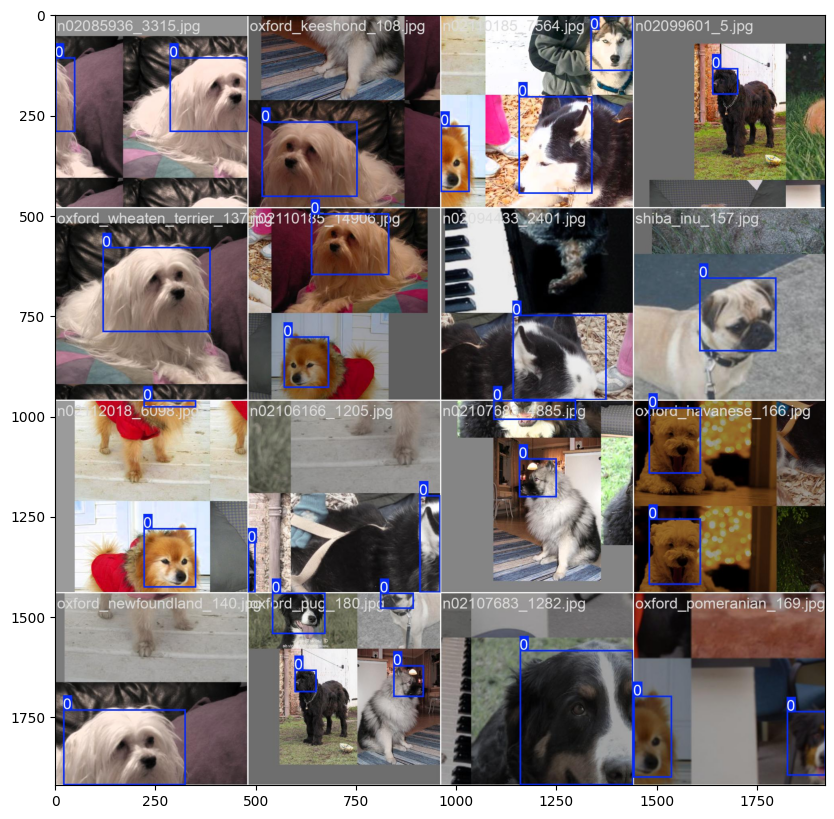

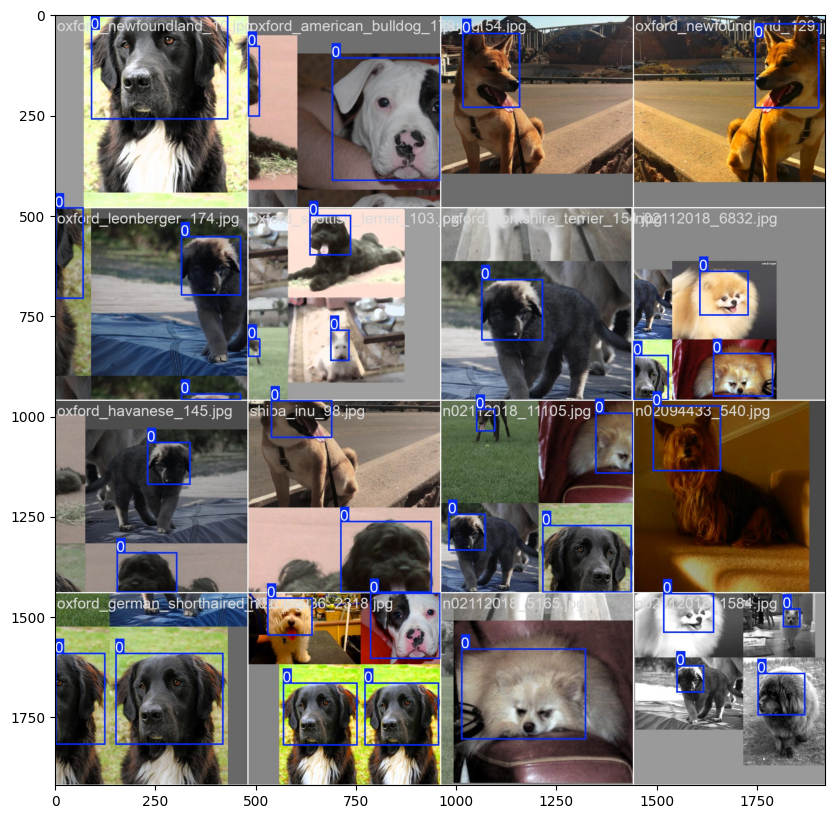

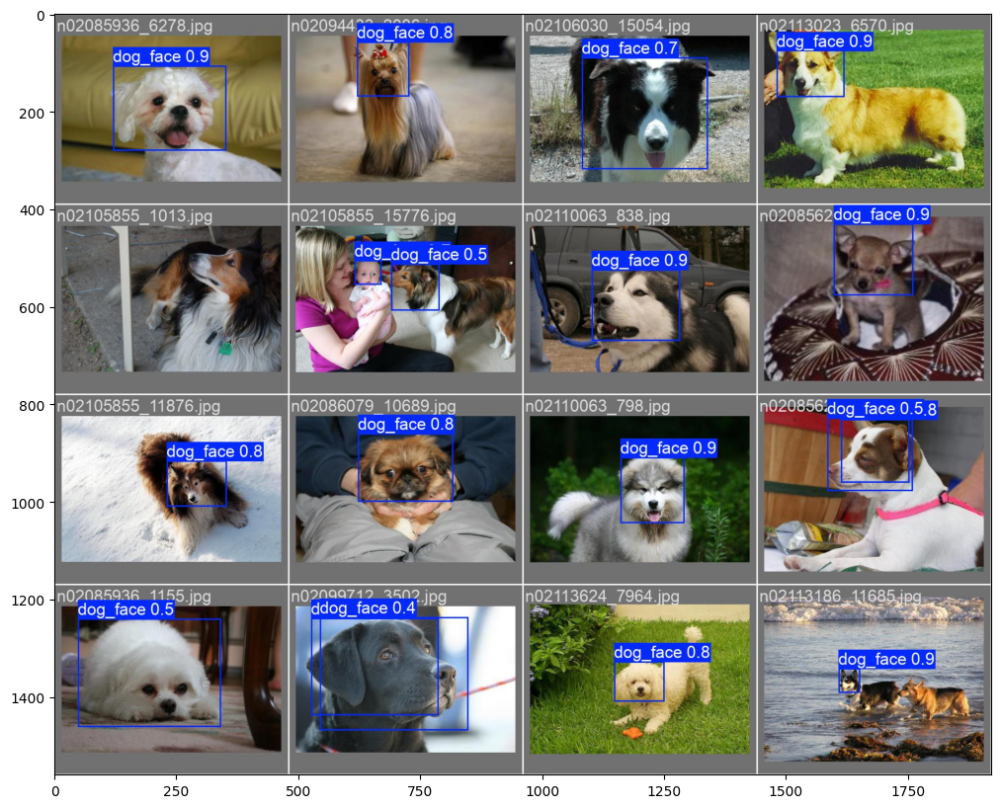

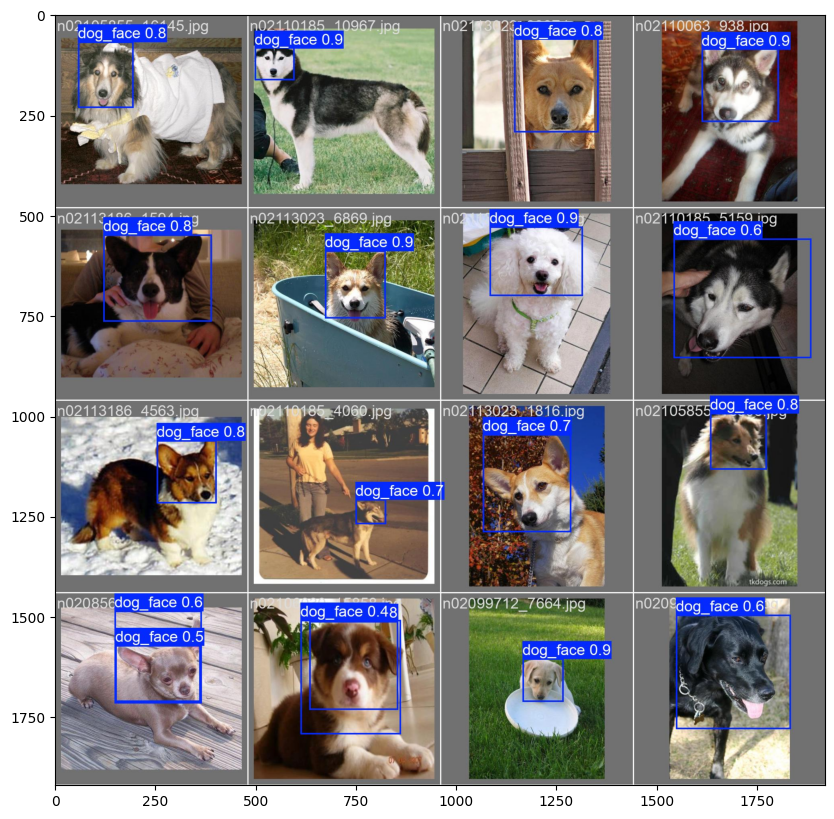

In [22]:
metrics_list = [
    "/kaggle/working/runs/detect/train/F1_curve.png",
    "/kaggle/working/runs/detect/train/results.png",
    "/kaggle/working/runs/detect/train/PR_curve.png",
    "/kaggle/working/runs/detect/train/confusion_matrix.png",
    "/kaggle/working/runs/detect/train/labels.jpg",
    "/kaggle/working/runs/detect/train/train_batch900.jpg",
    "/kaggle/working/runs/detect/train/train_batch0.jpg",
    "/kaggle/working/runs/detect/train/train_batch1.jpg",
    "/kaggle/working/runs/detect/train/train_batch2.jpg",
    "/kaggle/working/runs/detect/train/val_batch0_pred.jpg",
    "/kaggle/working/runs/detect/train/val_batch1_pred.jpg"
]

for i in metrics_list:
    img = Image.open(i)
    image=np.array(img)
    plt.figure(figsize=(20,10))
    plt.imshow(image)
    plt.show()